# SPATIAL ANALYSIS OF ISS DATASETS

This tutorial is an example of how to use Squidpy to analyze In Situ Sequencing datasets, performing several different statistical tests to understand the spatial organization of tissues. This tutorial follows the scanpy tutorial/pciseq tutorials, so we'll take as an input an h5 object created. More information, if needed, can be found at: https://squidpy.readthedocs.io/en/stable/tutorials.html

# Loading the needed packages

The first step is to load the needed packages. If any of them fails, please go and check that they are installed in the appropiate environment

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as st
import squidpy as sq
import scanpy as sc
import os

# Load your dataset

We are going to load our dataset, were we have alredy performed clustering, from an h5ad file. If you want to check how to format your data in this format, please check the Scanpy tutorial

In [2]:
adata=sc.read('/mnt/c/Users/sergio.salas/Documents/PhD/projects/DIPG/adata_16samples_healthy_v3.h5')
adata

AnnData object with n_obs × n_vars = 232484 × 68
    obs: 'GABRG2', 'CCDC153', 'MYL9', 'GPC3', 'TMEM212', 'BCAS1', 'PdHIST1H3B Mut_B2DO', 'X', 'Y', 'Cell_ID', 'Y_IF', 'X_IF', 'mean_IF', 'IF_Cell_ID', 'name', 'AC_like', 'Cycling', 'MES_like', 'OC_like', 'OPC_like', 'total_counts', 'n_genes', 'leiden', 'sample', 'batch', 'PDCD1', 'FCER1G', 'MEST', 'PLAUR', 'age', 'loc'

In [3]:
adata=adata[~adata.obs['name'].isin(['nan'])]

In [4]:
adata.obsm["spatial"]=np.array([adata.obs.X*0.325,adata.obs.Y*0.325]).transpose().astype('float64')

Trying to set attribute `.uns` of view, copying.


A21-238_T_5


<Figure size 3600x3600 with 0 Axes>

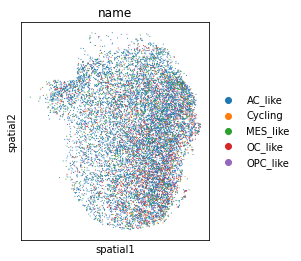

Trying to set attribute `.uns` of view, copying.


AAA076530001_1


<Figure size 3600x3600 with 0 Axes>

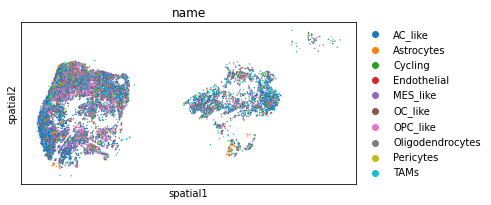

Trying to set attribute `.uns` of view, copying.


10417-10043


<Figure size 3600x3600 with 0 Axes>

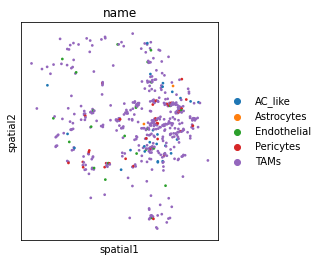

Trying to set attribute `.uns` of view, copying.


BT1954_5


<Figure size 3600x3600 with 0 Axes>

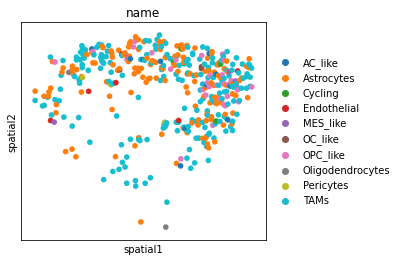

Trying to set attribute `.uns` of view, copying.


Run4_AAA01043_10


<Figure size 3600x3600 with 0 Axes>

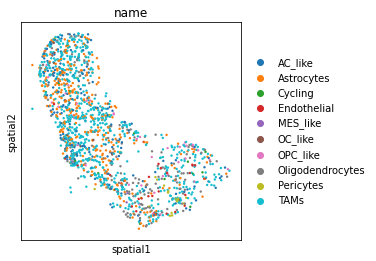

Trying to set attribute `.uns` of view, copying.


XT9824_4


<Figure size 3600x3600 with 0 Axes>

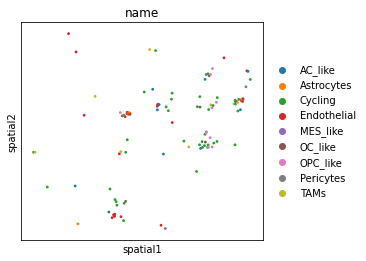

Trying to set attribute `.uns` of view, copying.


BT1873_pons_4


<Figure size 3600x3600 with 0 Axes>

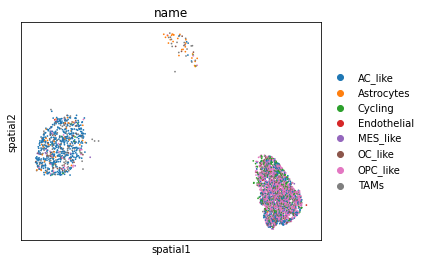

Trying to set attribute `.uns` of view, copying.


BT1873_ventricle_4


<Figure size 3600x3600 with 0 Axes>

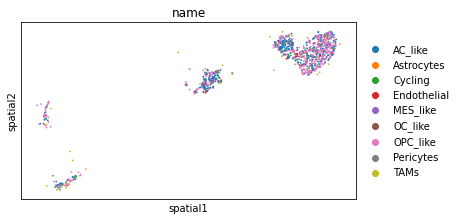

Trying to set attribute `.uns` of view, copying.


UMPED65_A2_2


<Figure size 3600x3600 with 0 Axes>

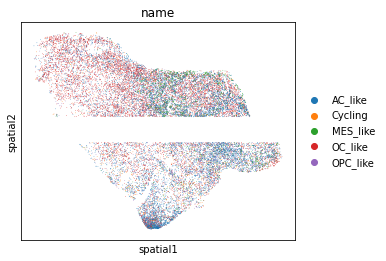

Trying to set attribute `.uns` of view, copying.


MUV1


<Figure size 3600x3600 with 0 Axes>

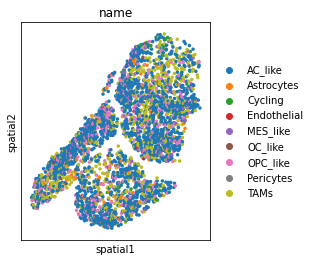

Trying to set attribute `.uns` of view, copying.


MUV31


<Figure size 3600x3600 with 0 Axes>

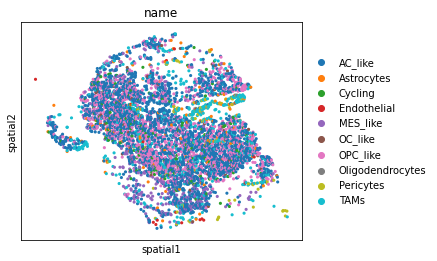

Trying to set attribute `.uns` of view, copying.


MUV78


<Figure size 3600x3600 with 0 Axes>

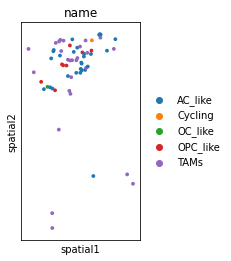

Trying to set attribute `.uns` of view, copying.


XT8698


<Figure size 3600x3600 with 0 Axes>

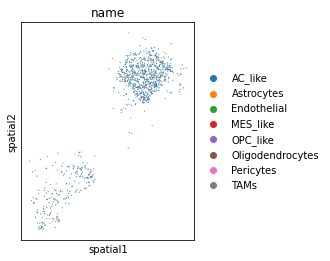

Trying to set attribute `.uns` of view, copying.


MGH666641


<Figure size 3600x3600 with 0 Axes>

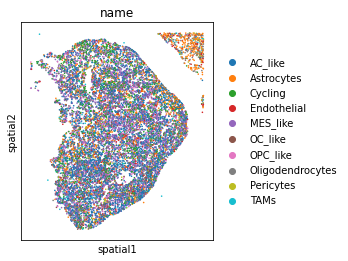

Trying to set attribute `.uns` of view, copying.


UMPED103_SVZ_6


<Figure size 3600x3600 with 0 Axes>

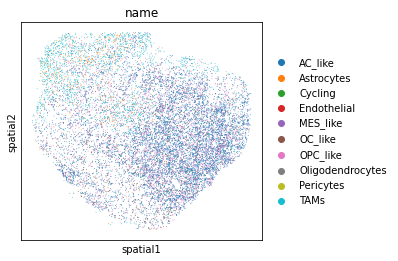

Trying to set attribute `.uns` of view, copying.


UMPED103_pons_2


<Figure size 3600x3600 with 0 Axes>

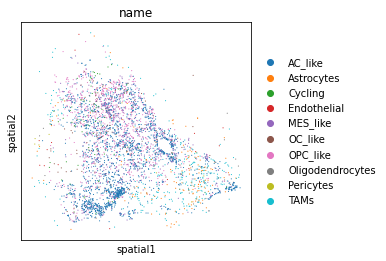

In [5]:
for samp in adata.obs['sample'].unique():
    asub=adata[adata.obs['sample']==samp]
    print(samp)
    plt.figure(figsize=(50,50))
    sc.pl.spatial(
    asub,
    color="name",
    neighbors_key="spatial_neighbors",
    spot_size=40,
    edges=False,
    edges_width=2,
    img_key=None,
    )

# NEIGHBORHOOD PLOTS

In [5]:
np.unique(adata.obs['name'])

array(['AC_like', 'Astrocytes', 'Cycling', 'Endothelial', 'MES_like',
       'OC_like', 'OPC_like', 'Oligodendrocytes', 'Pericytes', 'TAMs'],
      dtype=object)

In [6]:
ad=adata

In [189]:
anndata_list = []
for sample in ad.obs['sample'].unique():
    adata_copy_int = ad[ad.obs['sample'] == sample ]
    adata_copy_int.obs.index = list(pd.DataFrame(list((adata_copy_int.obs['sample'])))[0] +'_' +pd.DataFrame(list((adata_copy_int.obs.index)))[0])
    sq.gr.spatial_neighbors(adata_copy_int,radius=70.0)
    arrs=((adata_copy_int.obsp['spatial_distances']>0).toarray())*1
    datf=pd.DataFrame(arrs)
    datf['key']=list(adata_copy_int.obs['name'])
    neighmatrix=datf.groupby('key').sum().transpose()
    adataneigh=sc.AnnData(neighmatrix)
    adataneigh.obs=adata_copy_int.obs
    adataneigh.obs['counts']=list(np.sum(neighmatrix,axis=1))
    anndata_list.append(adataneigh)
ad_sp_concat = sc.concat(anndata_list, pairwise=True,join='outer')

In [190]:
ad_sp_concat.var.index

Index(['AC_like', 'Astrocytes', 'Cycling', 'Endothelial', 'MES_like',
       'OC_like', 'OPC_like', 'Oligodendrocytes', 'Pericytes', 'TAMs'],
      dtype='object', name='key')

In [240]:
adataneigh=ad_sp_concat#[:,ad_sp_concat.var.index.isin(['MES_like','Cycling','OPC_like','AC_like','OC_like'])]
adataneigh.obsm["spatial"]=np.array([adataneigh.obs.X*0.325,adataneigh.obs.Y*0.325]).transpose().astype('float64')
adataneigh.X=np.nan_to_num(adataneigh.X)

In [241]:
adataneigh=adataneigh[adataneigh.obs['counts']>6]
#adataneigh=adataneigh[adataneigh.obs['counts']<80]

(array([4.634e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 4.249e+03, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 3.662e+03, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 3.033e+03, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 2.743e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        2.418e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.145e+03,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 2.040e+03, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+0

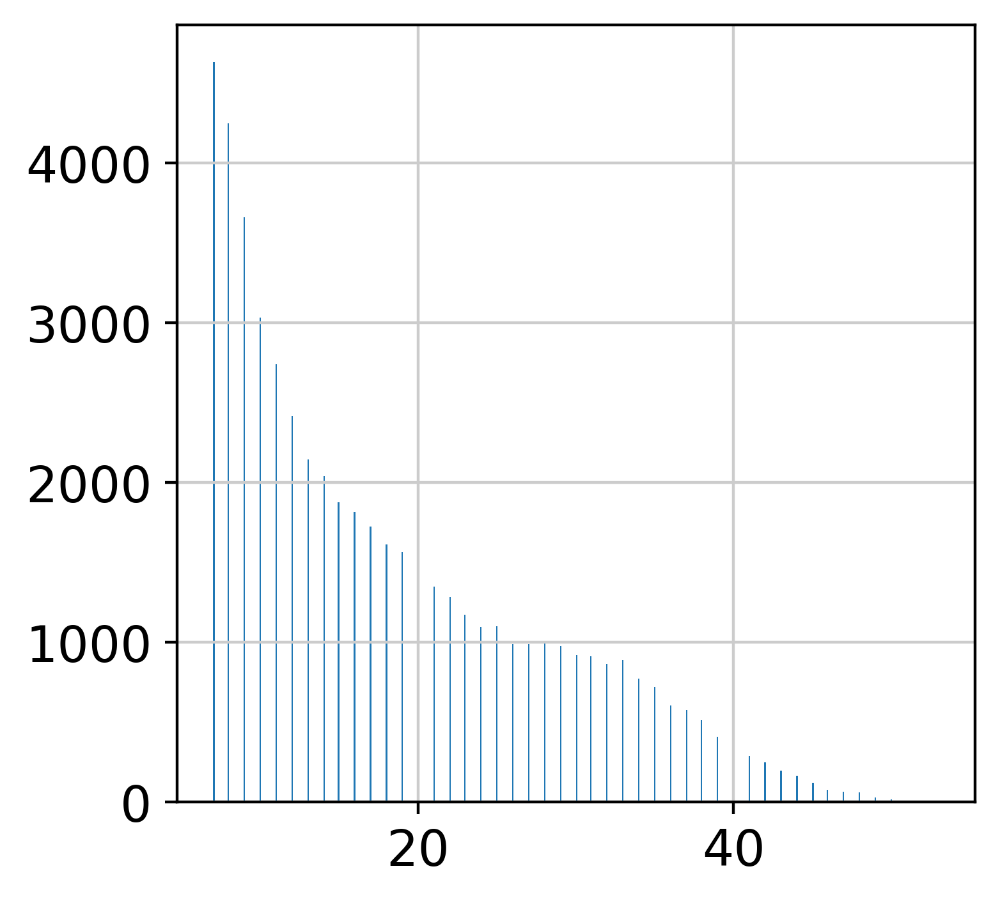

In [242]:
plt.hist(adataneigh.obs['counts'],500)

In [243]:
adataneigh.raw=adataneigh
#sc.pp.normalize_total(adataneigh, target_sum=1e4)
#sc.pp.log1p(adataneigh)

In [244]:
adataneigh

AnnData object with n_obs × n_vars = 53783 × 10
    obs: 'GABRG2', 'CCDC153', 'MYL9', 'GPC3', 'TMEM212', 'BCAS1', 'PdHIST1H3B Mut_B2DO', 'X', 'Y', 'Cell_ID', 'Y_IF', 'X_IF', 'mean_IF', 'IF_Cell_ID', 'name', 'AC_like', 'Cycling', 'MES_like', 'OC_like', 'OPC_like', 'total_counts', 'n_genes', 'leiden', 'sample', 'batch', 'PDCD1', 'FCER1G', 'MEST', 'PLAUR', 'age', 'loc', 'counts'
    obsm: 'spatial'

In [245]:
sc.pp.neighbors(adataneigh, n_neighbors=8)
sc.tl.leiden(adataneigh,resolution=0.3,key_added='clusters')

In [247]:
sc.tl.umap(adataneigh,min_dist=0.1)
sc.set_figure_params(scanpy=True, dpi=200)

In [248]:
colordictio={'AC_like': '#D95F02',
 'Cycling': '#FCD12A',
 'MES_like': '#1B9E77',
 'OC_like': '#E7298A',
 'OPC_like': '#7570B3',
 'Endothelial': '#E5C484',
 'TAMs': '#A6D854',
 'T Cells': '#FC8D62',
 'Oligodendrocytes': '#80B1D3',
 'Pericytes': '#D9D9D9',
 'Astrocytes': '#FCCDE5'}
arr=np.unique(adataneigh.obs['name'])
arrout=[]
for el in arr:
    arrout.append(colordictio[el])
adataneigh.uns['name_colors']=arrout

/home/sergioms/anaconda3/envs/squidpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'name' as categorical
/home/sergioms/anaconda3/envs/squidpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden' as categorical
/home/sergioms/anaconda3/envs/squidpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be remov

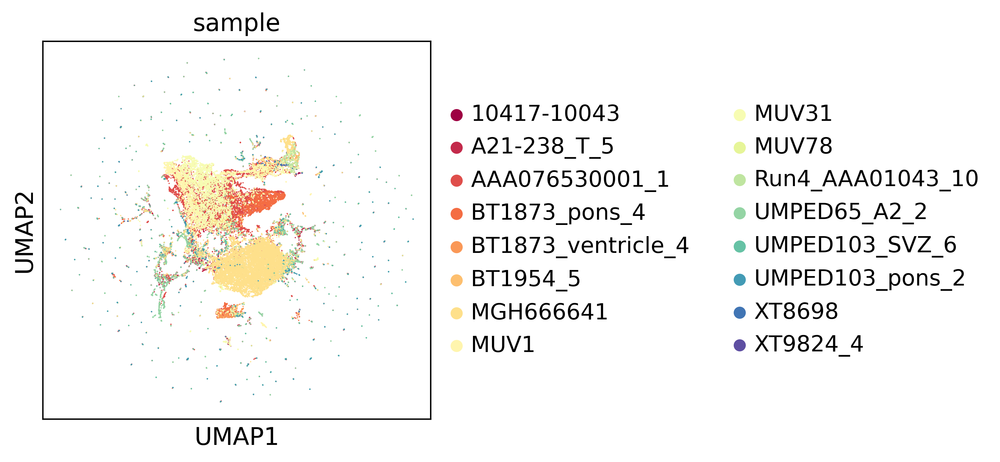

In [249]:
sc.pl.umap(adataneigh,color=['sample'],palette='Spectral')#,save='UMAP_10X_colors.svg')

In [250]:
tab=adataneigh.obs.groupby('clusters').count()
adataneigh=adataneigh[adataneigh.obs['clusters'].isin(tab.loc[tab.loc[:,'age']>800].index)]

Trying to set attribute `.uns` of view, copying.


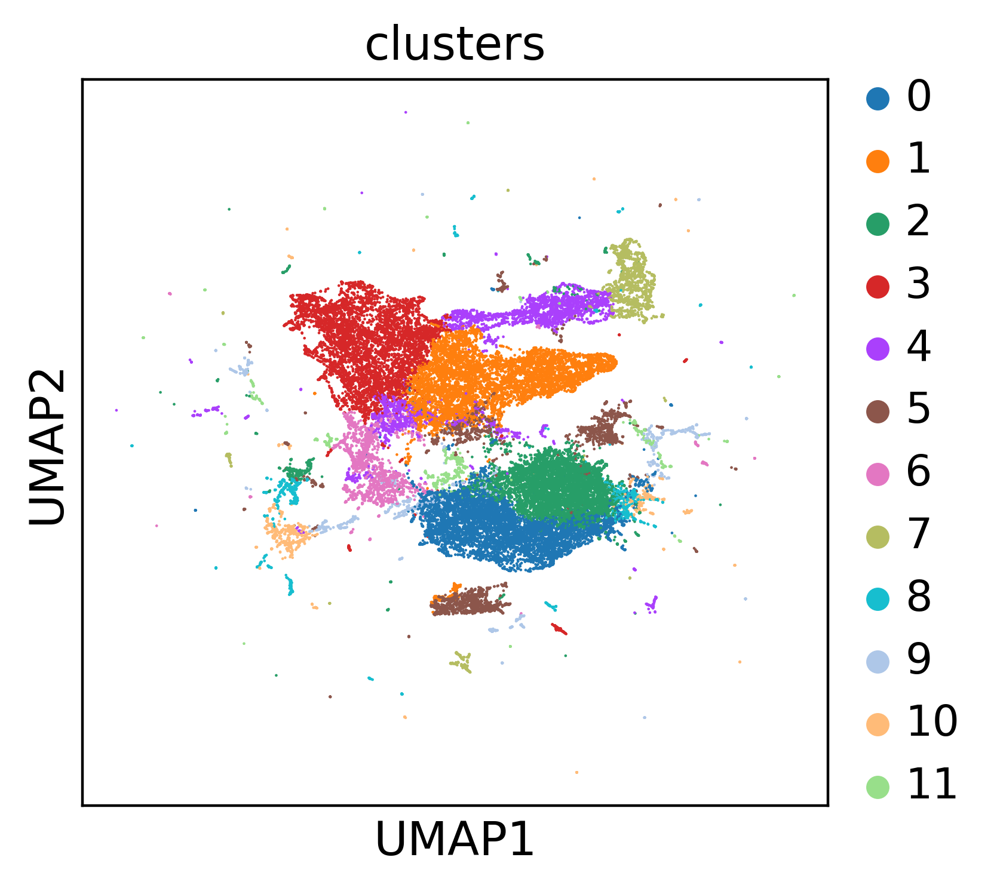

In [251]:
#plt.rcParams['plt.facecolor'] = 'white'
sc.pl.umap(adataneigh,color=['clusters'])#,save='UMAP_10X_colors.svg')

In [252]:
adataneigh.var.index=adataneigh.var.index+'_neighbors'

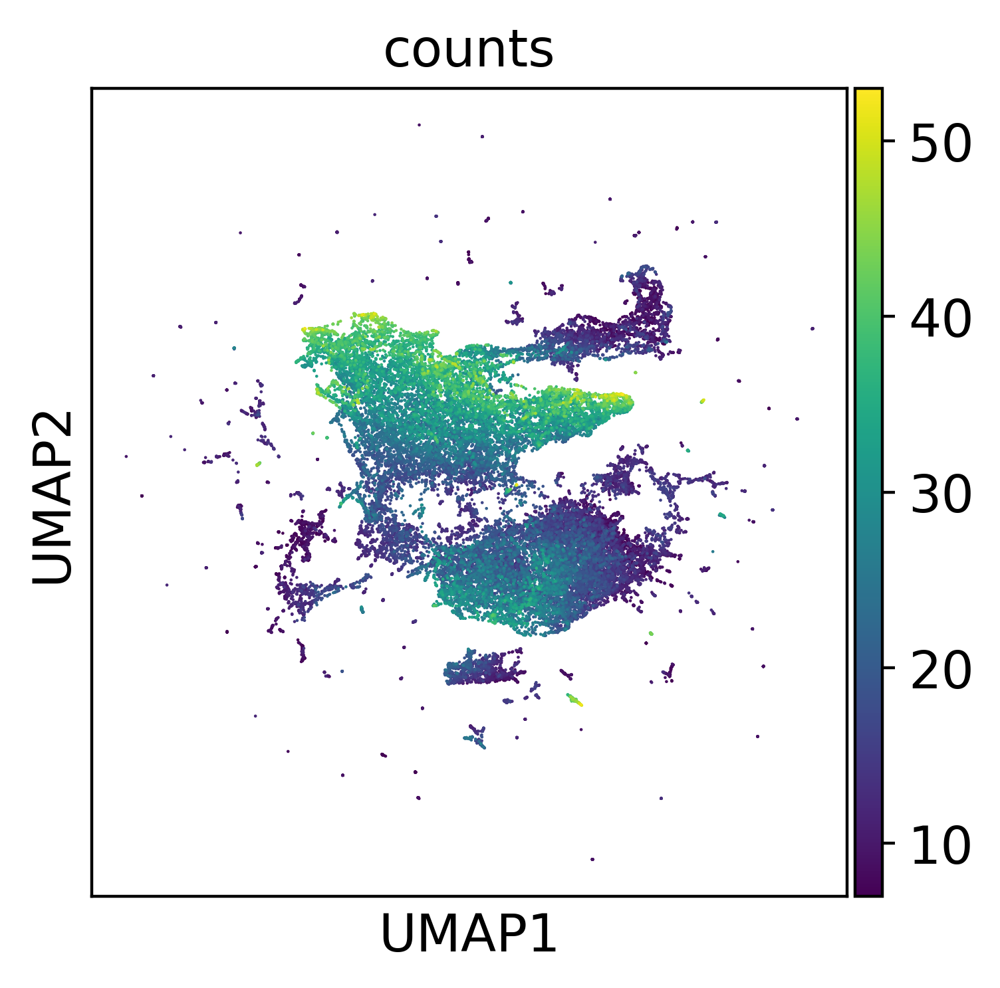

In [253]:
#plt.rcParams['plt.facecolor'] = 'white'
sc.pl.umap(adataneigh,color=['counts'])#,save='UMAP_10X_colors.svg')

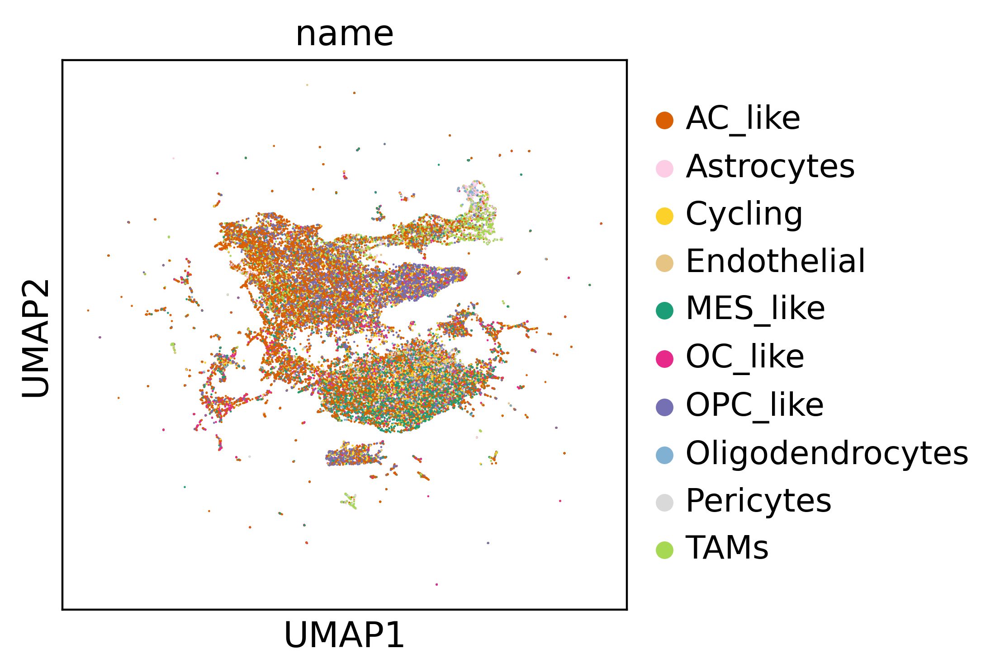

In [254]:
#plt.rcParams['plt.facecolor'] = 'white'
sc.pl.umap(adataneigh,color=['name'])#,save='UMAP_10X_colors.svg')

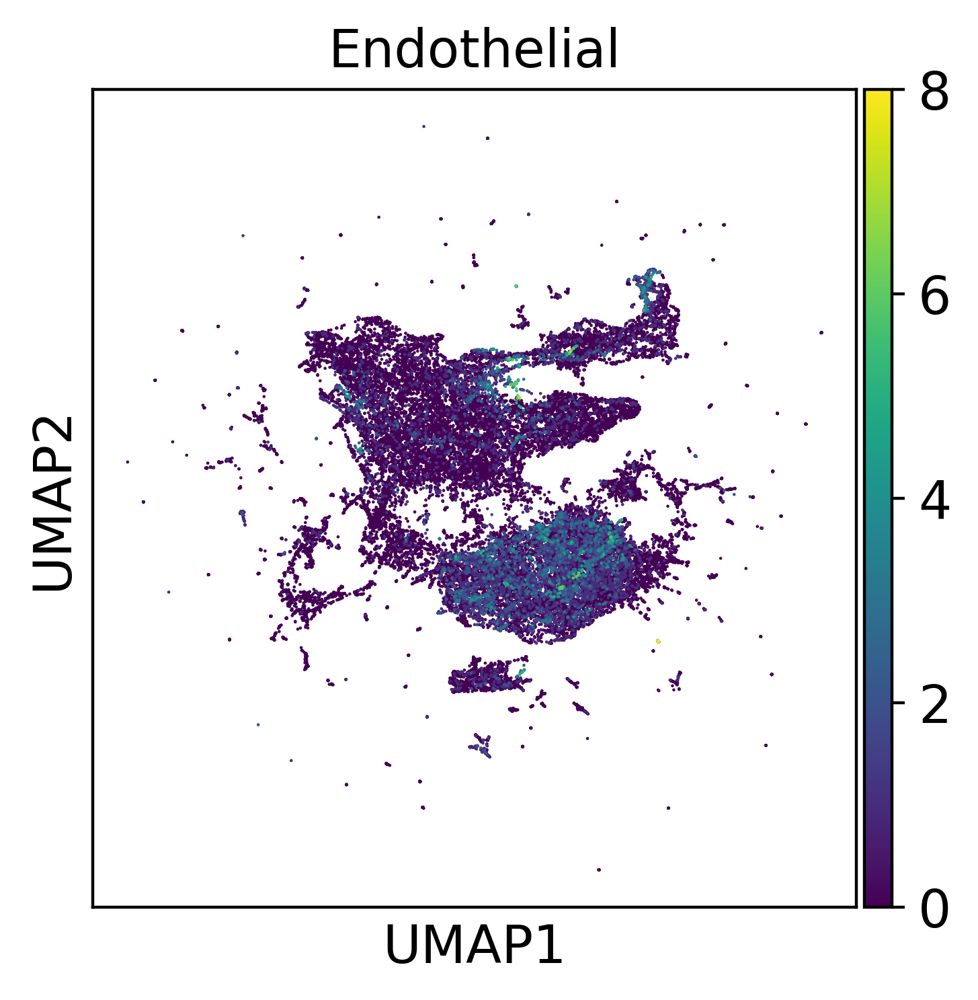

In [261]:
#plt.rcParams['plt.facecolor'] = 'white'
sc.pl.umap(adataneigh,color=['Endothelial'])#,save='UMAP_10X_colors.svg')

A21-238_T_5


<Figure size 10000x10000 with 0 Axes>

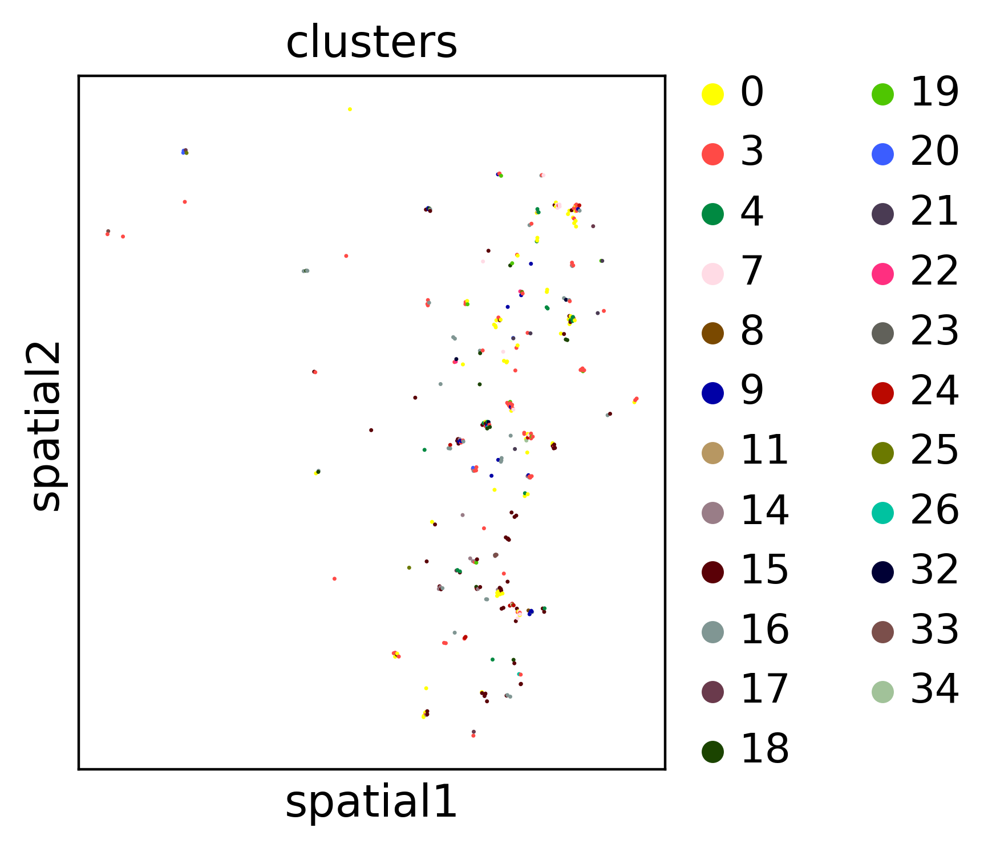

AAA076530001_1


<Figure size 10000x10000 with 0 Axes>

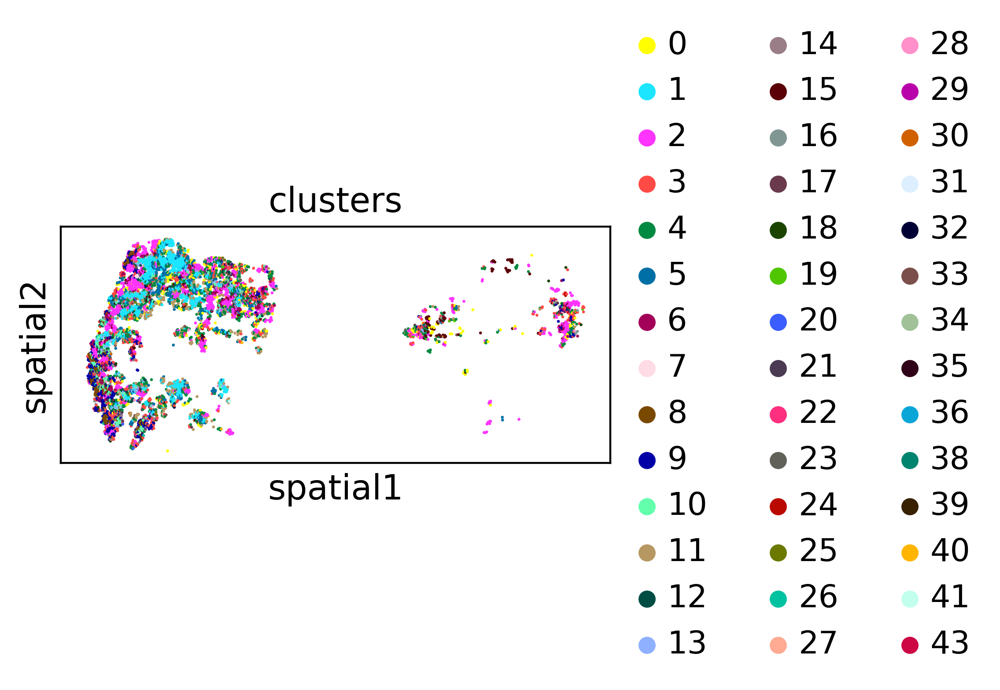

10417-10043


<Figure size 10000x10000 with 0 Axes>

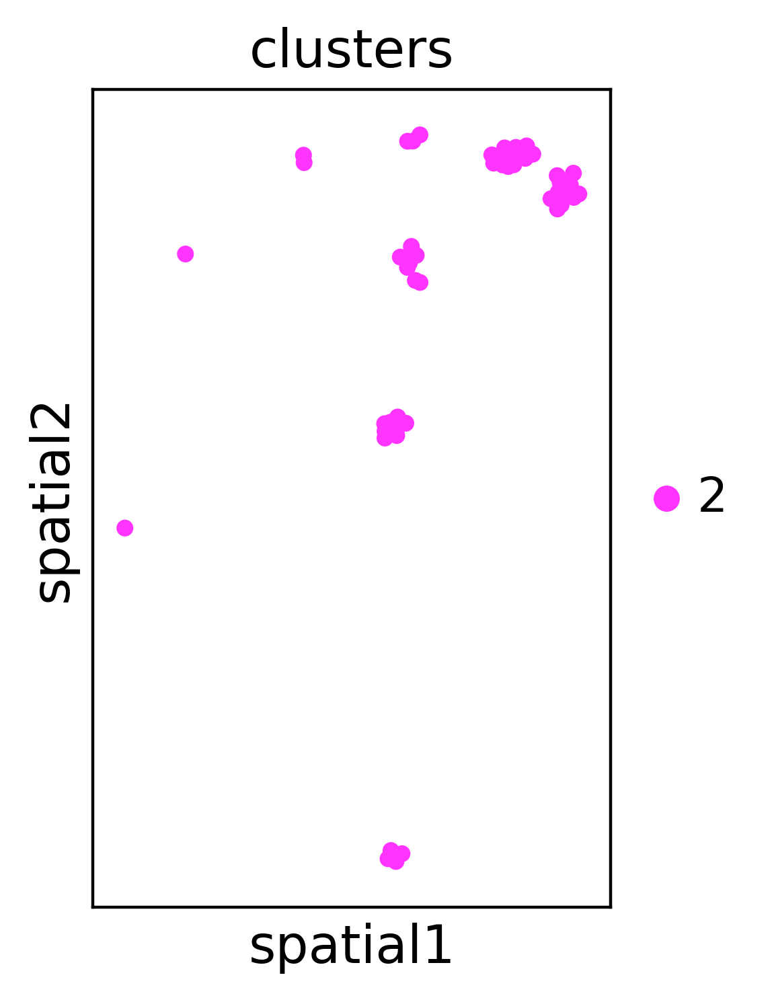

BT1954_5


<Figure size 10000x10000 with 0 Axes>

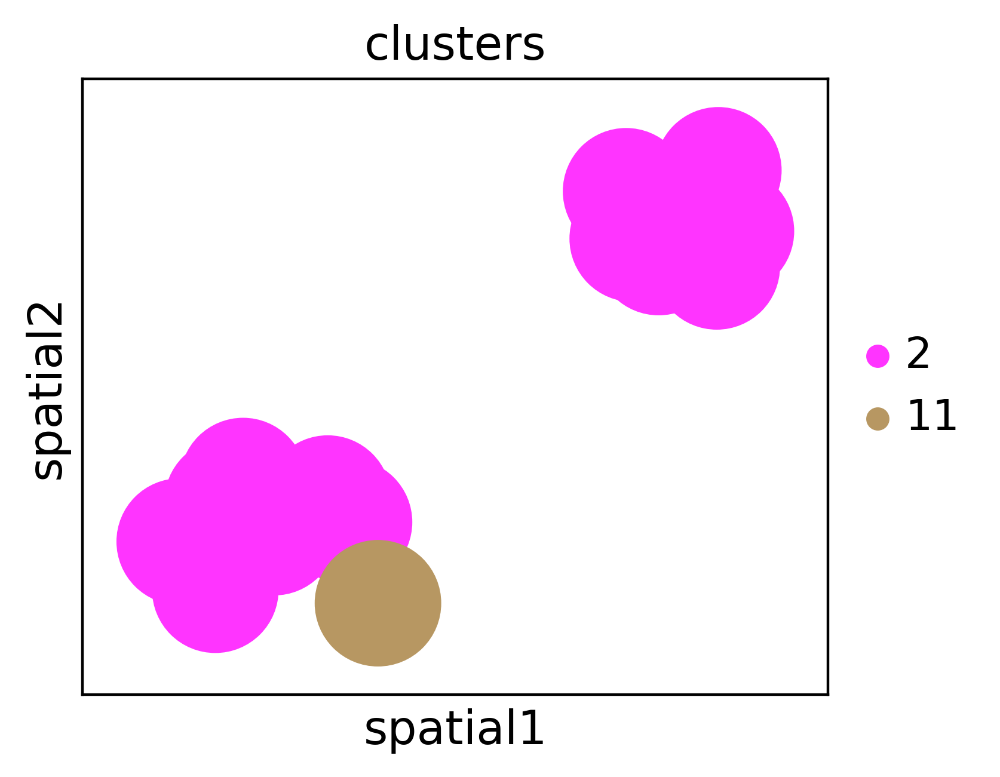

Run4_AAA01043_10


<Figure size 10000x10000 with 0 Axes>

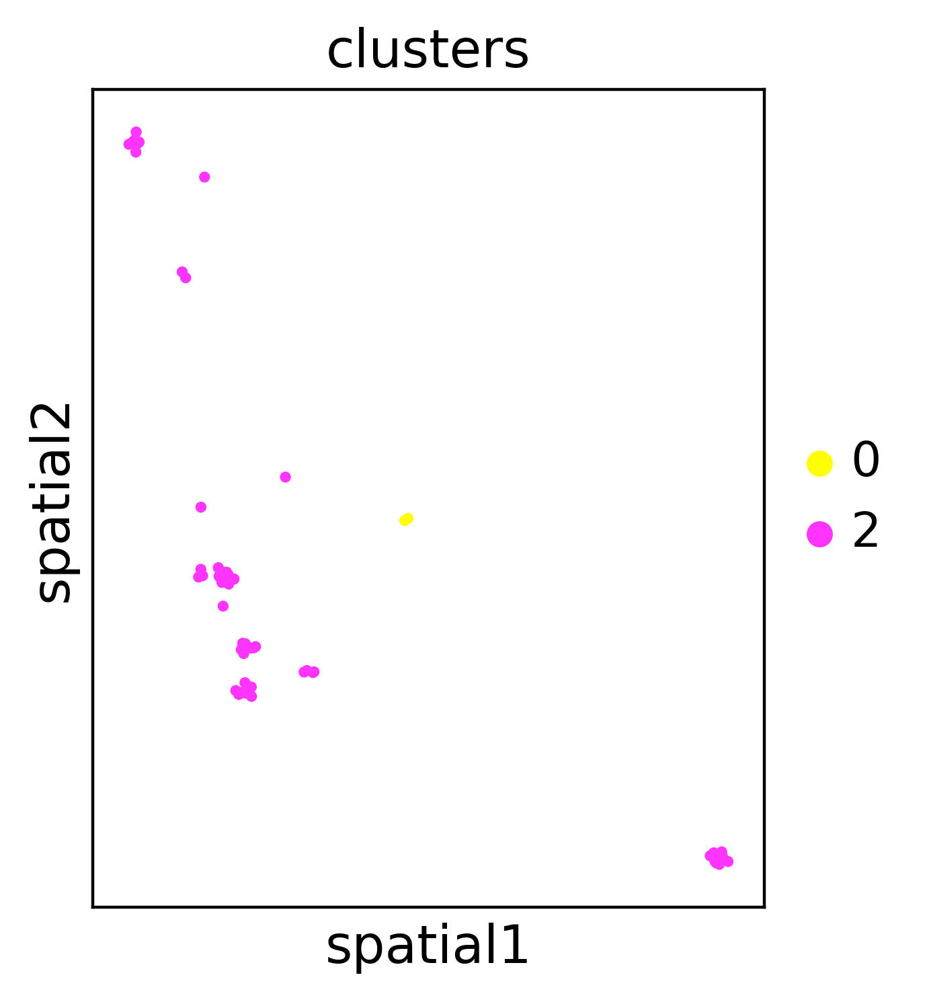

XT9824_4


<Figure size 10000x10000 with 0 Axes>

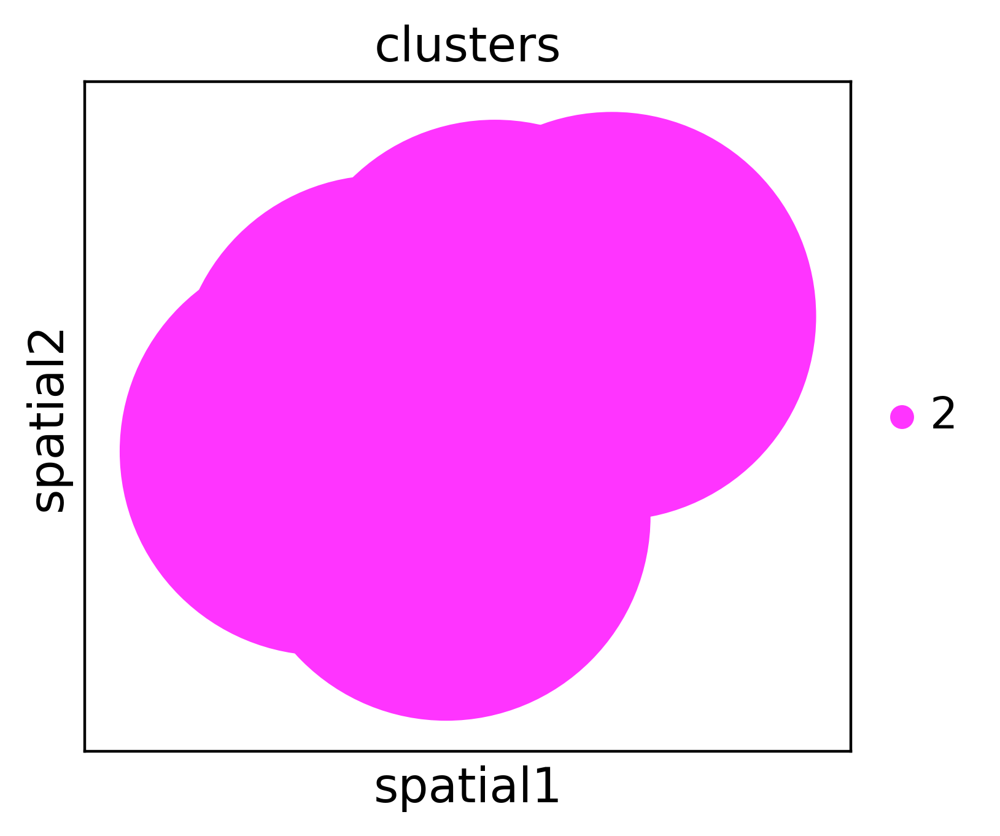

BT1873_pons_4


<Figure size 10000x10000 with 0 Axes>

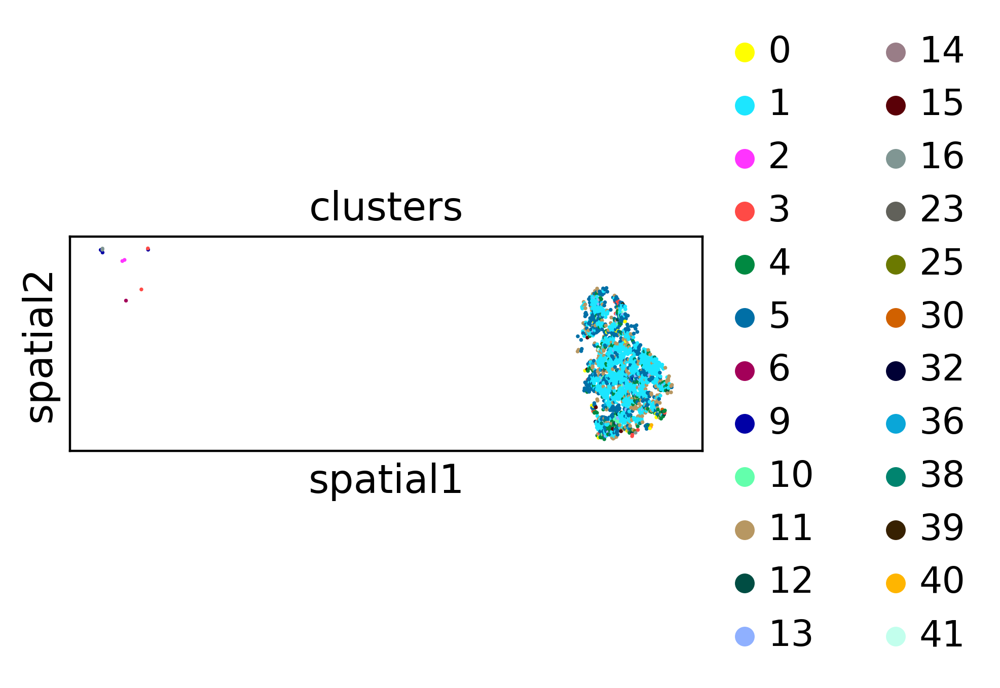

BT1873_ventricle_4


<Figure size 10000x10000 with 0 Axes>

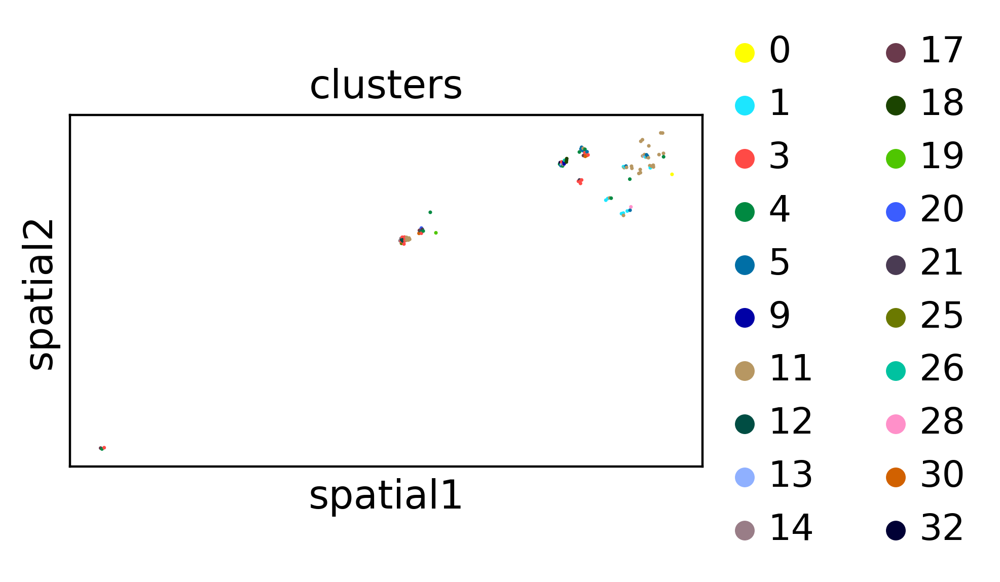

UMPED65_A2_2


<Figure size 10000x10000 with 0 Axes>

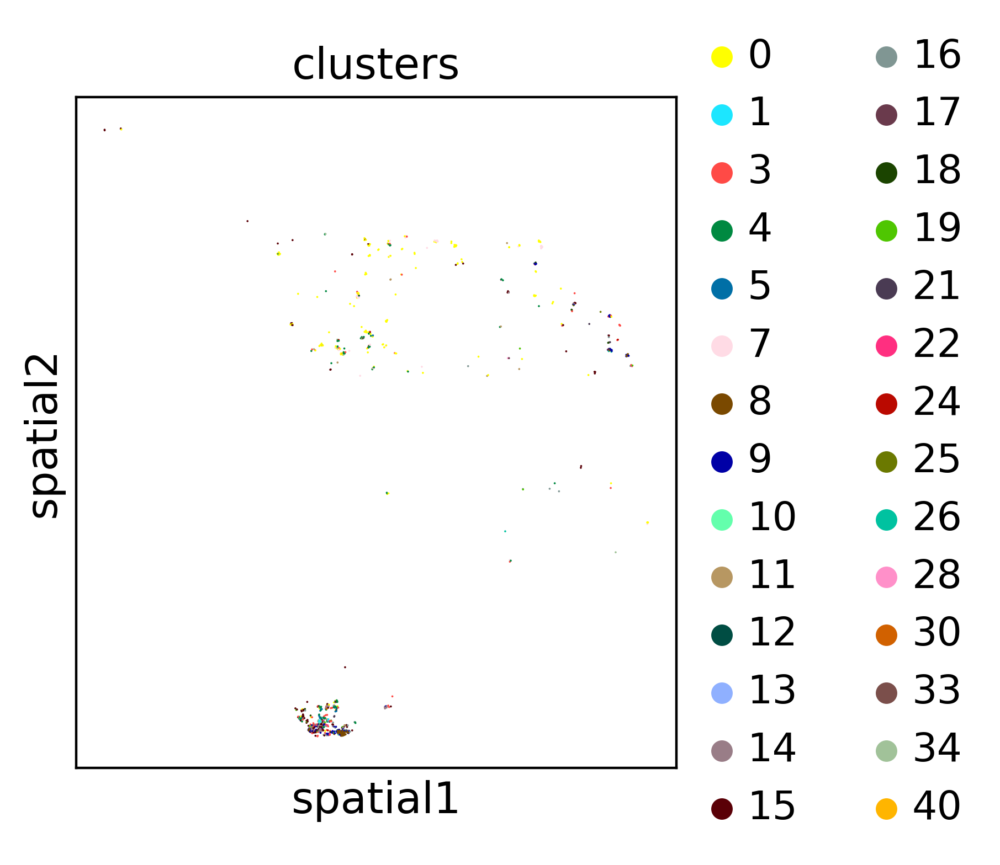

MUV1


<Figure size 10000x10000 with 0 Axes>

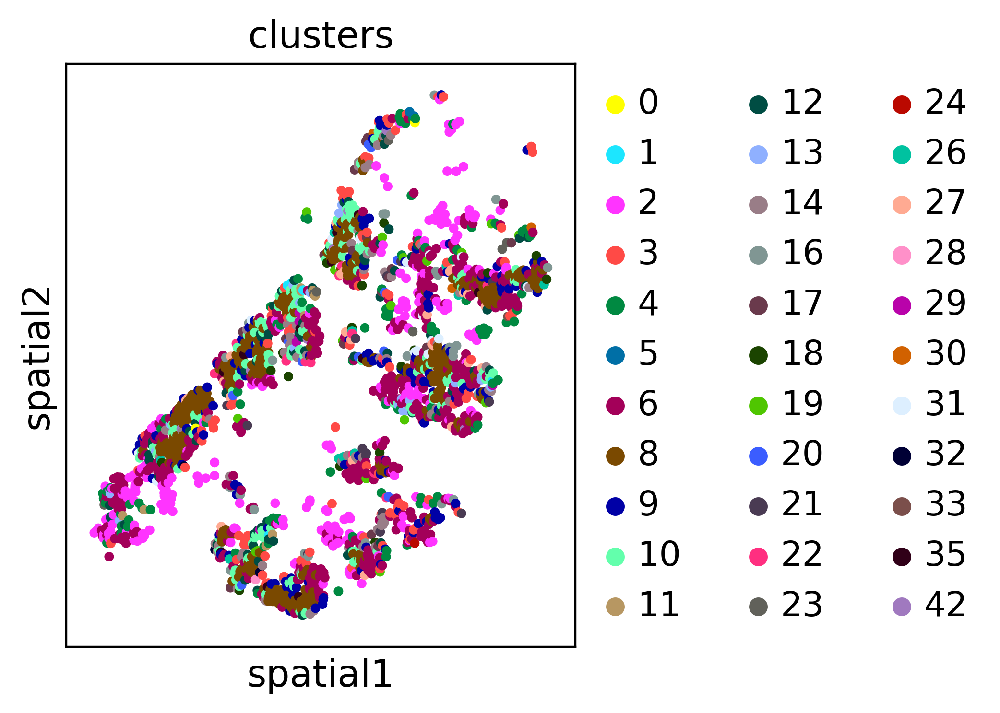

MUV31


<Figure size 10000x10000 with 0 Axes>

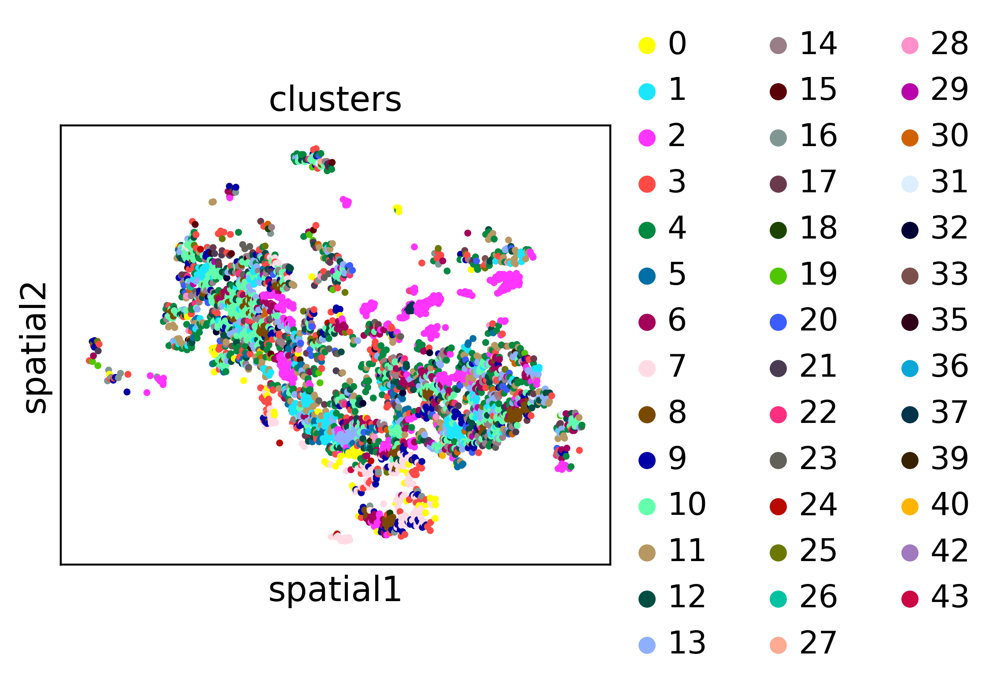

XT8698


<Figure size 10000x10000 with 0 Axes>

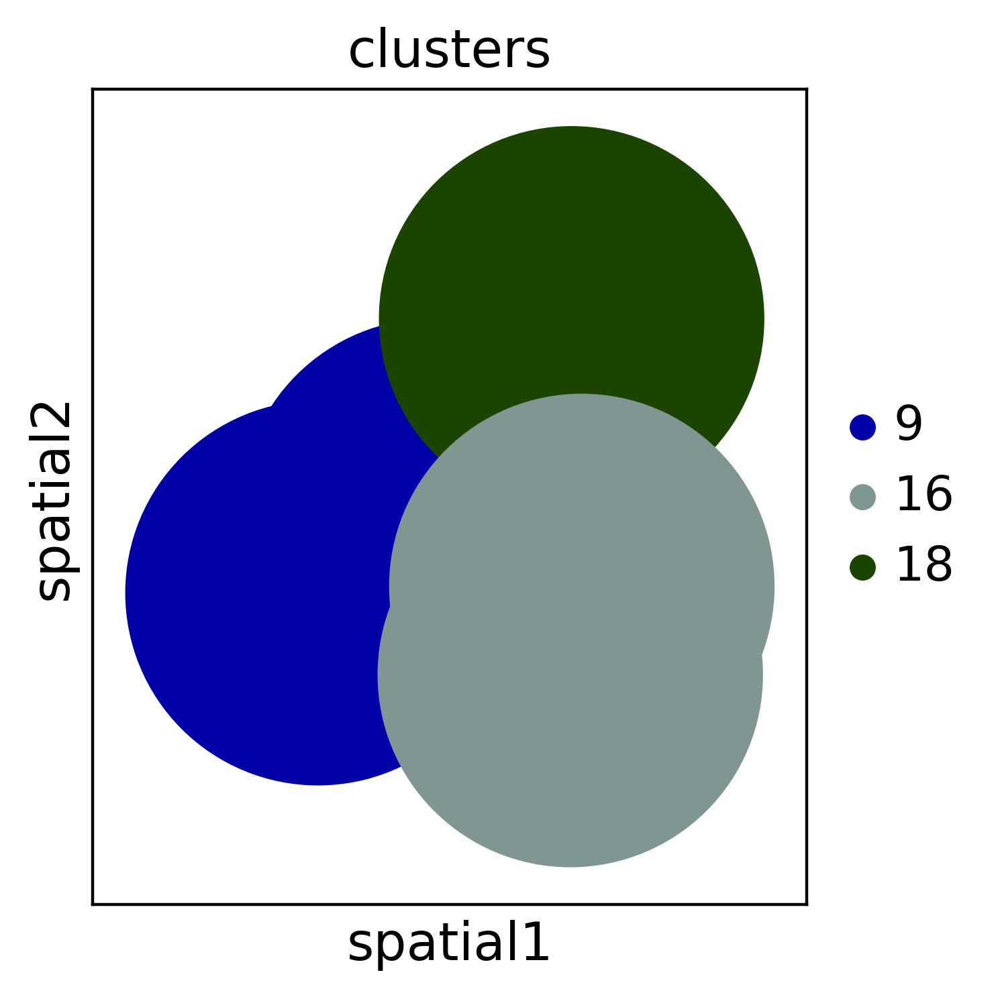

MGH666641


<Figure size 10000x10000 with 0 Axes>

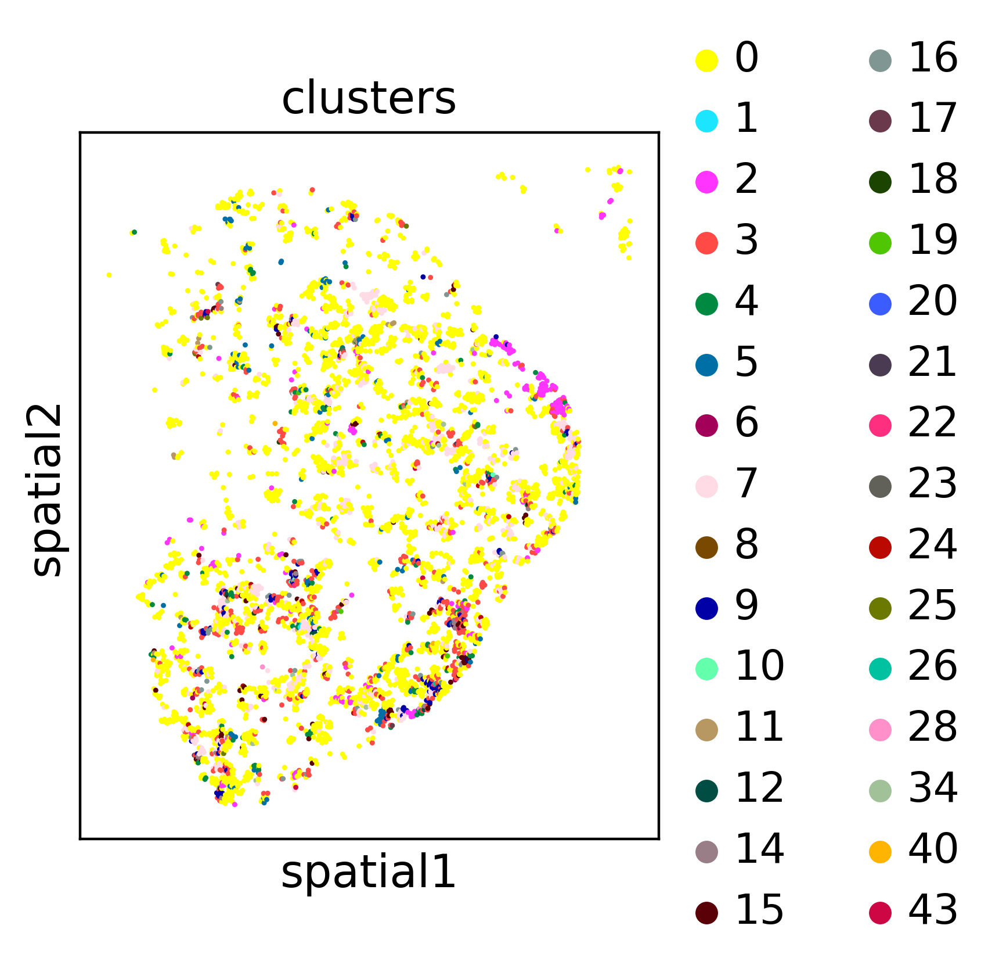

UMPED103_SVZ_6


<Figure size 10000x10000 with 0 Axes>

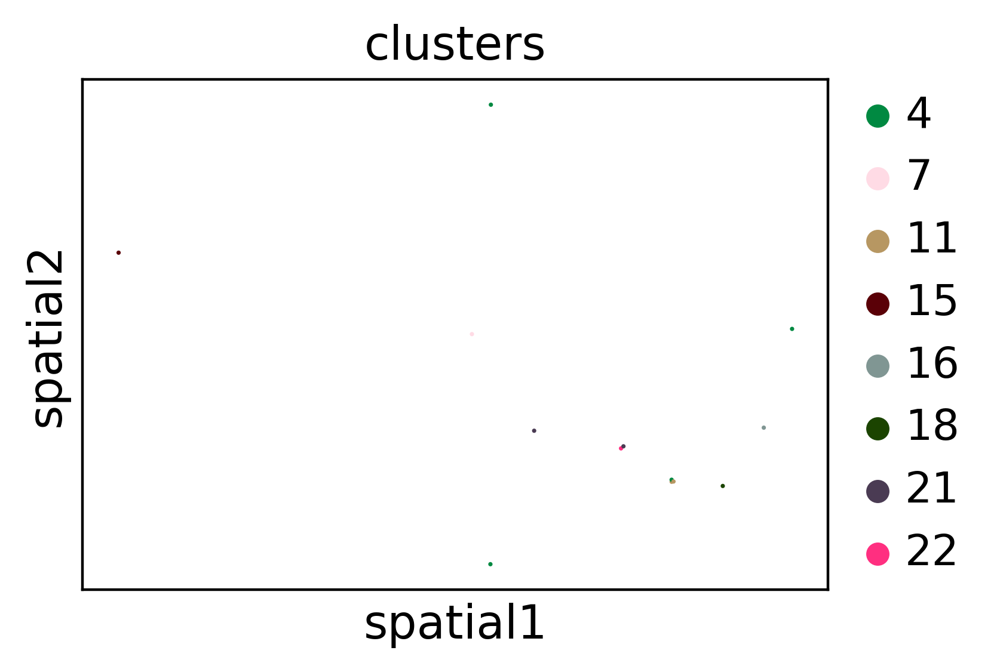

UMPED103_pons_2


<Figure size 10000x10000 with 0 Axes>

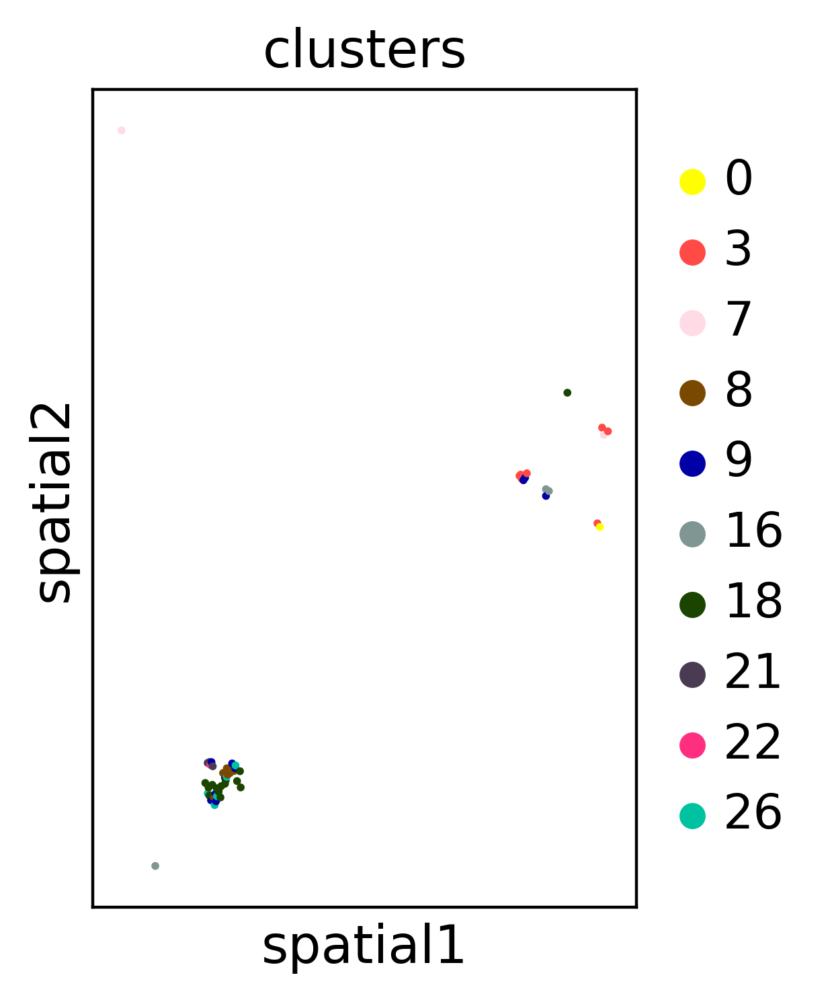

In [188]:
for samp in adataneigh.obs['sample'].unique():
    asub=adataneigh[adataneigh.obs['sample']==samp]
    print(samp)
    plt.figure(figsize=(50,50))
    sc.pl.spatial(
    asub,
    color="clusters",
    neighbors_key="spatial_neighbors",
    spot_size=40,
    edges=False,
    edges_width=2,
    img_key=None,
    )

In [74]:
#plt.rcParams['plt.facecolor'] = 'white'
sc.pl.umap(adataneigh,color=['AC_like_neighbors', 'Astrocytes_neighbors', 'Cycling_neighbors',
       'Endothelial_neighbors', 'MES_like_neighbors', 'OC_like_neighbors',
       'OPC_like_neighbors', 'Oligodendrocytes_neighbors',
       'Pericytes_neighbors', 'TAMs_neighbors'])#,save='UMAP_10X_colors.svg')

KeyError: 'AC_like_neighbors'

<Figure size 3864x2400 with 0 Axes>

In [ ]:
def map_of_clusters(adata,key='leiden',clusters='all',size=8,background='white',figuresize=(10,7),save=None,format='pdf'):
    
    #PARAMETERS TO MODIFY:
    #-key: the terms in adata.obs that you want to plot
    #-clusters:'all' for plotting all clusters in a single plot, 'individual': for plots of individual genes, or ['3','5'] (your groups
    #          between square brackets to plot only some clusters
    #-size: to change the size of your spots
    #-background: to change the color of the background
    #-figuresize: to specify the size of your figure
    #-save: if you want to save your figure, give the PATH of the folder where you want to save it
    #-format: specify the format in which you want to save your figure
    
    try:
        adata.obs[key]=adata.obs[key].astype(int)
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    except:
        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    #cl.apply(lambda x: colors[x])
    plt.rcParams['figure.facecolor'] = background
    if clusters=='all':
        cl=adata.obs[key]
        plt.figure(figsize=figuresize)
        figa=plt.scatter(x=adata.obs.X,y=adata.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        if not save==None:
            plt.savefig(save +'/map_all_clusters_'+str(size)+'_'+background+'_'+key+'.'+format)
    elif clusters=='individual':
        cl=adata.obs[key]
        for each in adata.obs[key].unique():
            adatasub=adata[adata.obs[key]==each]
            plt.figure(figsize=figuresize)
            plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
            cl=adatasub.obs[key]
            plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
            plt.axis('off')
            plt.title('Group: '+ str(each))
            if not save==None:
                plt.savefig(save +'/map_inidivdual_cluster_'+str(each)+'_'+str(size)+background+'_'+key+'.'+format)
    else:
        adatasub=adata[adata.obs[key].isin(clusters)]
        plt.figure(figsize=figuresize)
        plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
        cl=adatasub.obs[key]
        plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        plt.legend()
        if not save==None:
                s=''
                for element in clusters:
                    s=s+str(element)
                print(s)
                plt.savefig(save +'/map_group_of_clusters_'+str(s)+'_'+str(size)+background+'_'+key+'.'+format)
#        plt.title('Group: '+ paste(clusters))

In [ ]:
adataneigh

In [ ]:
adataneigh.obs['X']=list(adataneigh.obs.x)
adataneigh.obs['Y']=list(-adataneigh.obs.y)

In [ ]:
adataneigh

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attrib

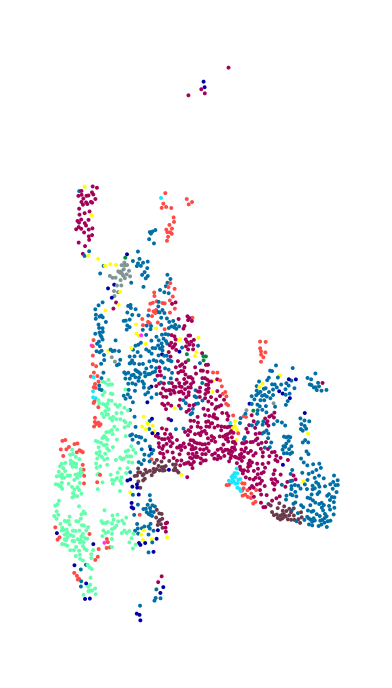

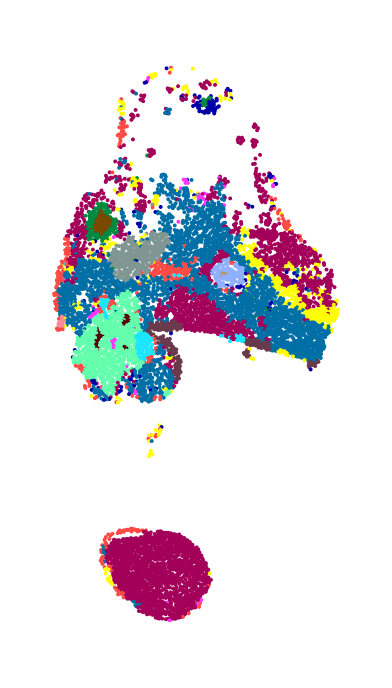

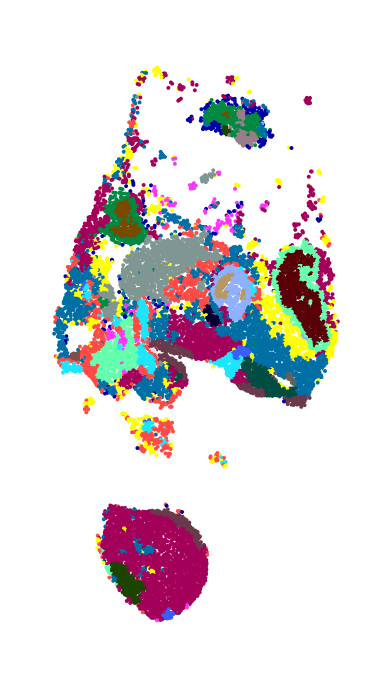

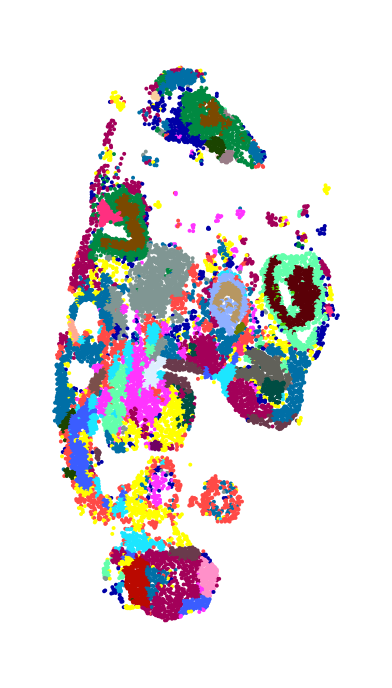

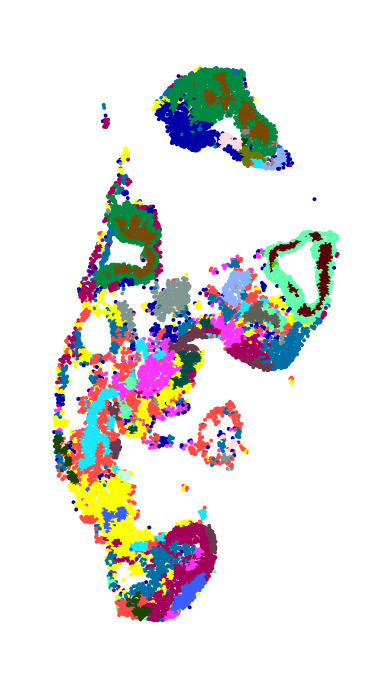

...

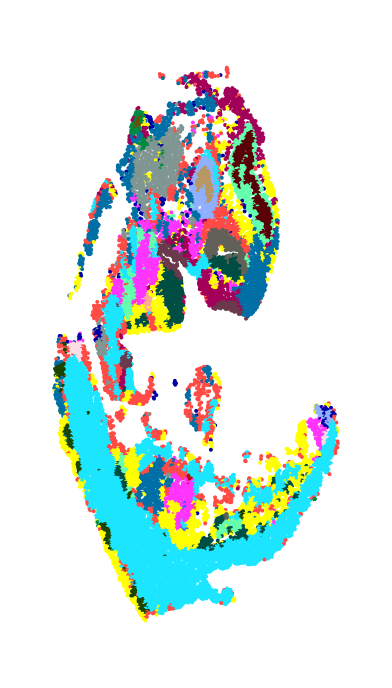

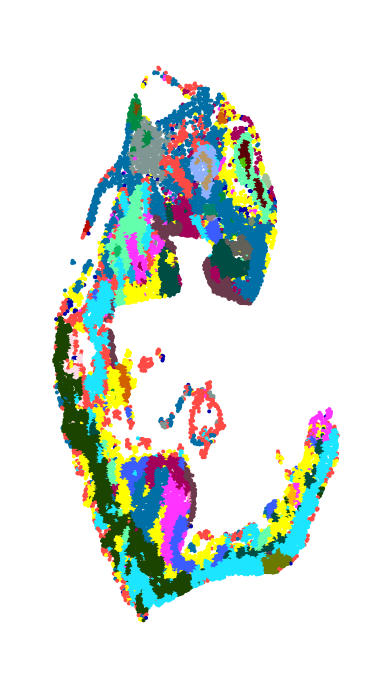

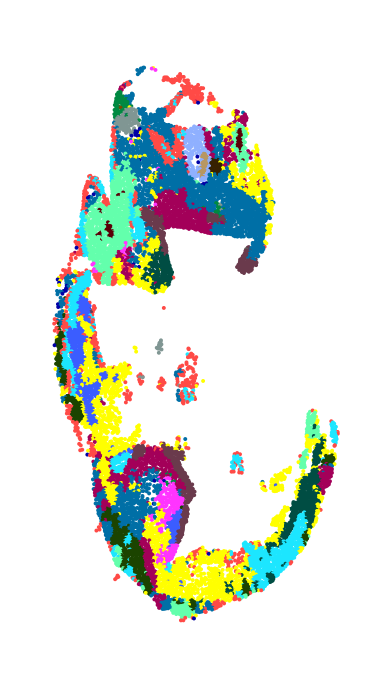

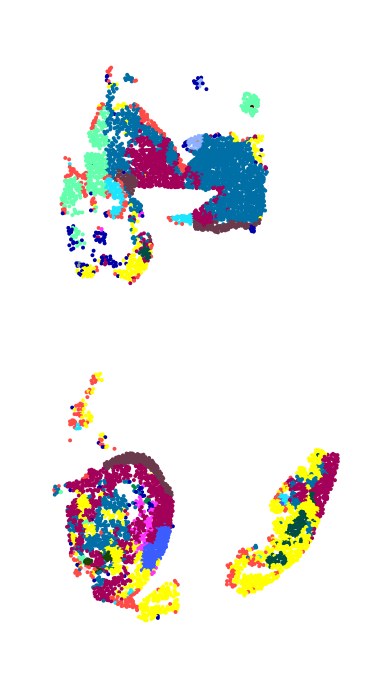

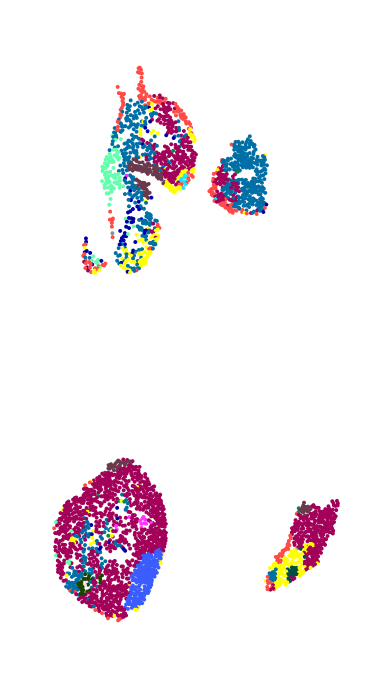

In [377]:
for sample in adataneigh.obs['sample'].unique():
    adata_copy_int = adataneigh[adataneigh.obs['sample'] == sample ]
    map_of_clusters(adata_copy_int,key='clusters',size=0.5,background='white',clusters='all',figuresize=(1,2))#,save='C:/Users/sergio.salas/Documents/PhD',format='pdf')